links to the models:

GRU: 
https://drive.google.com/file/d/1-xk4zBaDZLoHZ1123GPRhZTeMCwPQrWW/view?usp=sharing

LSTM: 
https://drive.google.com/file/d/1-azn1H9CDp4175EikzApggGNYOdniRtx/view?usp=sharing

Bi-LSTM:
https://drive.google.com/file/d/1-SRZLXOKohU_9RwwoG28LeQ5krdFtOPg/view?usp=sharing


# Functions/Classes

In [ ]:
# https://towardsdatascience.com/...
# ...10-tips-for-a-better-google-colab-experience-33f8fe721b82
# https://colab.research.google.com/github/tensorflow/text/blob/...
# ...master/docs/tutorials/transformer.ipynb?hl=fr#scrollTo=jmjh290raIky

In [ ]:
%%capture
from multiprocessing import cpu_count
import pandas as pd

# for plug and play w2v
!pip install gensim
from gensim.models.word2vec import Word2Vec
from gensim.models import FastText


# Ref: https://textacy.readthedocs.io/en/0.12.0/api_reference/...
# ...preprocessing.html#textacy.preprocessing.normalize.hyphenated_words

""" 
Textacy is a Python library for performing higher-level NLP tasks,
built on the high-performance Spacy lib. With the basics — tokenization, 
part-of-speech tagging, parsing — offloaded to another library, textacy 
focuses on tasks facilitated by the availability of tokenized, POS-tagged,
and parsed text: keyterm extraction, readability statistics, 
emotional valence analysis, quotation attribution, and more.
"""
# for cooking textual input
!pip install textacy
from textacy import preprocessing
from functools import partial

# for lemmetiztion 
!pip install nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet 
from nltk import download as nltk_downloader
from nltk import pos_tag ,word_tokenize
nltk_downloader('wordnet')
nltk_downloader('punkt')
nltk_downloader('averaged_perceptron_tagger')

In [ ]:
# # EDA section requirements:
# %%capture
# !pip install https://github.com/ydataai/pandas-profiling/archive/master.zip
# import numpy as np
# import pandas as pd
# from pandas_profiling import ProfileReport

# import matplotlib.pyplot as plt
# import seaborn as sns

In [ ]:
# !pip install tensorflow

In [5]:
%%capture
import tensorflow
# import keras

from keras.regularizers import l2
# from keras.models import Sequential
# from keras.optimizers import Adam
from keras.layers import Activation, Input, concatenate
from keras.models import Model

# from keras.layers.normalization import BatchNormalization
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import Concatenate
from keras.layers.core import Lambda, Flatten, Dense
from keras.layers import Input, Dense, Flatten, GlobalMaxPool2D
from keras.layers import GlobalAvgPool2D, Concatenate, Multiply, Dropout
from keras.layers import Input, Concatenate, Flatten, Dense,Embedding,LSTM
from keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.layers import Bidirectional
import numpy as np



In [46]:
from keras.layers import GRU

In [34]:
from keras.utils.vis_utils import plot_model

In [30]:
# for saving the best model
from tensorflow.keras.callbacks import ModelCheckpoint
import keras
import matplotlib.pyplot as plt
#!pip install IPython
from IPython.display import clear_output as cls

class PlotLosses(keras.callbacks.Callback):

  def on_train_begin(self,logs={}):
    self.i = 0
    self.x = []
    self.losses= []
    self.val_losses = []
    self.fig = plt.figure()
    self.logs = []

    self.accuracy = []
    self.val_accuracy = []

  def on_epoch_end(self, epoch, logs={}):
    self.logs.append(logs)
    self.x.append(self.i)
    self.losses.append(logs.get('loss'))
    self.val_losses.append(logs.get('val_loss'))    
    self.i +=1
    self.accuracy.append(logs.get('accuracy'))
    self.val_accuracy.append(logs.get('val_accuracy'))

    cls(wait=True)
    plt.plot(self.x, self.losses, label= 'loss')
    plt.plot(self.x, self.val_losses, label= 'val_loss')
    plt.legend()
    plt.show()

    plt.plot(self.x, self.accuracy, label= 'accuracy')
    plt.plot(self.x, self.val_accuracy, label= 'val_accuracy')
    plt.legend()
    plt.show()

In [35]:
from keras.layers import *
from keras.models import *
from keras import backend as K

class attention(Layer):
    
    def __init__(self, return_sequences=True):
        self.return_sequences = return_sequences
        super(attention,self).__init__()
        
    def build(self, input_shape):
        
        self.W=self.add_weight(name="att_weight", shape=(input_shape[-1],1),
                               initializer="normal")
        self.b=self.add_weight(name="att_bias", shape=(input_shape[1],1),
                               initializer="zeros")
        
        super(attention,self).build(input_shape)
        
    def call(self, x):
        
        e = K.tanh(K.dot(x,self.W)+self.b)
        a = K.softmax(e, axis=1)
        output = x*a
        
        if self.return_sequences:
            return output
        
        return K.sum(output, axis=1)

In [ ]:
lemmatizer = WordNetLemmatizer()

def nltk_pos_tagger(nltk_tag):
    if nltk_tag.startswith('J'):
        return wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return wordnet.VERB
    elif nltk_tag.startswith('N'):
        return wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return wordnet.ADV
    else:          
        return None

def my_lemmetizer(sentence):
  # Ref: https://www.holisticseo.digital/python-seo/nltk/lemmatize
  nltk_tagged = pos_tag(word_tokenize(sentence))  
  wordnet_tagged= map(lambda x:(x[0], nltk_pos_tagger(x[1])), nltk_tagged)
  lemmatized_sentence = []

  for word, tag in wordnet_tagged:
      if tag is None:
          lemmatized_sentence.append(word)
      else:        
          lemmatized_sentence.append(lemmatizer.lemmatize(word, tag))
  return " ".join(lemmatized_sentence)

def my_tokenizer(t):
  return t.strip().split()

def my_stop_remover(t):
  # implement if needed
  return t

oven = preprocessing.make_pipeline(
    preprocessing.remove.html_tags,
    preprocessing.replace.emails,
    preprocessing.replace.emojis,
    preprocessing.replace.hashtags,
    preprocessing.replace.numbers,
    preprocessing.replace.phone_numbers,
    preprocessing.replace.urls,
    preprocessing.replace.user_handles,
    preprocessing.replace.currency_symbols,
    preprocessing.normalize.bullet_points,
    preprocessing.normalize.hyphenated_words,
    preprocessing.normalize.quotation_marks,
    partial(preprocessing.normalize.repeating_chars, chars ="?", maxn=1),
    preprocessing.normalize.unicode,
    preprocessing.remove.accents,
    preprocessing.remove.brackets,
    preprocessing.remove.punctuation,
    preprocessing.normalize.whitespace,
    my_lemmetizer,
    my_tokenizer,
    my_stop_remover,
)

In [ ]:
# t="I am voting for that politician in this NLTK Lemmatization example "
# print(lemmatizer.lemmatize(t)) 
# print(lemmatizer.lemmatize("voting"))
# print(lemmatizer.lemmatize("voting", "v"))
# print(lemmatize_sentence(t))

# I am voting for that politician in this NLTK Lemmatization example 
# voting
# vote
# I be vote for that politician in this NLTK Lemmatization example 

# raw_text = """ The best programs, are the ones written when the
# programmer 5.5 ! ??? # @ h-p ardestani@gmail.com is supposed to be
# working on something else.Mike bought the book for $50 $ 50 although 
# in Paris it will cost $30 dollars. Don’t document the problem, fix it.
# This is from https://twitter.com/codewisdom?lang=en. 🥰 #Pro """

# print(oven(raw_text))

# ['The', 'best', 'program', 'be', 'the', 'one', 'write', 'when', 'the',
#  'programmer', 'NUMBER', 'h', 'p', 'EMAIL', 'be', 'suppose', 'to',
#  'be', 'work', 'on', 'something', 'else', 'Mike', 'buy', 'the',
#  'book', 'for', 'CUR', 'NUMBER', 'CUR', 'NUMBER', 'although', 'in',
#  'Paris', 'it', 'will', 'cost', 'CUR', 'NUMBER', 'dollar', 'Don',
#  't', 'document', 'the', 'problem', 'fix', 'it', 'This', 'be',
#  'from', 'URL', 'EMOJI', 'TAG']


# Driver Code

## Loading data

In [ ]:
# Hold out set: https://github.com/wasiahmad/paraphrase_identification/blob/master/dataset/msr-paraphrase-corpus/msr_paraphrase_test.txt#L1726
# https://github.com/wasiahmad/paraphrase_identification/tree/master/dataset

In [ ]:
%cd


In [ ]:
%%capture
!gdown --id 1xq5qq95nza4IiGZ0RAh8QtYHVnT9tD1_
!gdown --id 1v3uPW1d0eK3BZfpFRUS3vhp5tqT94JZb
!gdown --id 1P_HLLvGq15gsgDl5P6QYrHkTlkcytMdr # test.csv

In [ ]:
train_df = pd.read_csv('train.csv')
dev_df = pd.read_csv('dev.csv')
holdout_df = pd.read_csv('test.csv')

In [ ]:
train_df

,Unnamed: 0,label,id1,id2,sentence1,sentence2
0,0,1,702876,702977,"Amrozi accused his brother, whom he called ""th...","Referring to him as only ""the witness"", Amrozi..."
1,1,0,2108705,2108831,Yucaipa owned Dominick's before selling the ch...,Yucaipa bought Dominick's in 1995 for $693 mil...
2,2,1,1330381,1330521,They had published an advertisement on the Int...,"On June 10, the ship's owners had published an..."
3,3,0,3344667,3344648,"Around 0335 GMT, Tab shares were up 19 cents, ...","Tab shares jumped 20 cents, or 4.6%, to set a ..."
4,4,1,1236820,1236712,"The stock rose $2.11, or about 11 percent, to ...",PG&E Corp. shares jumped $1.63 or 8 percent to...
...,...,...,...,...,...,...
3664,4068,1,1628068,1628145,Gilroy police and FBI agents described Gehring...,"Saturday, officials in California described Ge..."
3665,4070,1,749248,749566,The new rules will allow a single company to o...,The changed national ownership limit allows a ...
3666,4071,1,1620264,1620507,"""At this point, Mr. Brando announced: 'Somebod...","Brando said that ""somebody ought to put a bull..."
3667,4072,0,1848001,1848224,"Martin, 58, will be freed today after serving ...",Martin served two thirds of a five-year senten...


In [ ]:
dev_df

,Unnamed: 0,label,id1,id2,sentence1,sentence2
0,2553,1,616425,616448,"For the first quarter, HP pulled in $2.94 bill...",H-P came in second with nearly $3.32 billion i...
1,3698,1,2700737,2700676,He was sentenced to five years in prison at at...,"Former postal worker, Douglas Lindsell, was se..."
2,1937,1,3290113,3290192,"But he added: ""You can't win elections by look...","""You can't win elections by looking through th..."
3,285,1,403037,402971,Revelations of the expenditures shocked some e...,Revelations of the expenditures shocked some e...
4,2870,1,1772514,1772604,Both devices use version 5.2 of the Palm opera...,Both devices use Palm OS 5.2 and feature a com...
...,...,...,...,...,...,...
402,3605,0,257789,257726,Knight had 29 interceptions in his six years w...,"Knight has 29 interceptions in six seasons, al..."
403,1900,1,1120681,1120716,"Gordon stressed that his bill ""is a lesson-lea...",But Gordon emphasized that the legislation he ...
404,1211,1,2170444,2170659,"""NASA's organizational culture and structure h...","""The NASA organizational culture had as much t..."
405,732,1,2241925,2242066,"Chad Kolton, emergency management spokesman wi...","Chad Kolton, emergency management spokesman wi..."


In [ ]:
holdout_df

,Unnamed: 0,label,id1,id2,sentence1,sentence2
0,0,1,1089874,1089925,"PCCW's chief operating officer, Mike Butcher, ...",Current Chief Operating Officer Mike Butcher a...
1,1,1,3019446,3019327,The world's two largest automakers said their ...,Domestic sales at both GM and No. 2 Ford Motor...
2,2,1,1945605,1945824,According to the federal Centers for Disease C...,The Centers for Disease Control and Prevention...
3,3,0,1430402,1430329,A tropical storm rapidly developed in the Gulf...,A tropical storm rapidly developed in the Gulf...
4,4,0,3354381,3354396,The company didn't detail the costs of the rep...,But company officials expect the costs of the ...
...,...,...,...,...,...,...
1720,1720,0,2685984,2686122,"After Hughes refused to rehire Hernandez, he c...",Hernandez filed an Equal Employment Opportunit...
1721,1721,0,339215,339172,There are 103 Democrats in the Assembly and 47...,Democrats dominate the Assembly while Republic...
1722,1722,0,2996850,2996734,Bethany Hamilton remained in stable condition ...,"Bethany, who remained in stable condition afte..."
1723,1723,1,2095781,2095812,"Last week the power station’s US owners, AES C...","The news comes after Drax's American owner, AE..."


In [ ]:
3669  +  407 + 1725 

5801

In [ ]:
dev_df.iloc[0]['sentence1']

'For the first quarter, HP pulled in $2.94 billion and captured 27.9 percent of the market.'

In [ ]:
train_df.iloc[3668]['sentence1']

"The 30-year bond US30YT=RR rose 22/32 for a yield of 4.31 percent, versus 4.35 percent at Wednesday's close."

In [ ]:
train_df.iloc[3668]['sentence2']

'The 30-year bond US30YT=RR grew 1-3/32 for a yield of 4.30 percent, down from 4.35 percent late Wednesday.'

## Cooking text

In [ ]:
train_df['s1_proc'] = train_df['sentence1'].apply(lambda x: oven(x))
train_df['s2_proc'] = train_df['sentence2'].apply(lambda x: oven(x))
dev_df['s1_proc'] = dev_df['sentence1'].apply(lambda x: oven(x))
dev_df['s2_proc'] = dev_df['sentence2'].apply(lambda x: oven(x))
holdout_df['s1_proc'] = holdout_df['sentence1'].apply(lambda x: oven(x))
holdout_df['s2_proc'] = holdout_df['sentence2'].apply(lambda x: oven(x))

In [ ]:
holdout_df.head(1)

,Unnamed: 0,label,id1,id2,sentence1,sentence2,s1_proc,s2_proc,s1_pad_int,s2_pad_int,s1_pad,s2_pad,s1_w2v,s2_w2v,s1_fast,s2_fast
0,0,1,1089874,1089925,"PCCW's chief operating officer, Mike Butcher, ...",Current Chief Operating Officer Mike Butcher a...,"[PCCW, s, chief, operate, officer, Mike, Butch...","[Current, Chief, Operating, Officer, Mike, But...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0.009873696, -0.29772758, 0.020134062, -0.34...","[[0.009873696, -0.29772758, 0.020134062, -0.34...","[[0.17214881, 0.05662593, 0.08894413, 0.043740...","[[0.17214881, 0.05662593, 0.08894413, 0.043740..."


In [ ]:
tmp1= [' '.join(x) for x in train_df['s1_proc']]
tmp2= [' '.join(x) for x in train_df['s2_proc']]
d= {'s1_proc':tmp1,'s2_proc':tmp2}
train_tmp = pd.DataFrame(d)

tmp1= [' '.join(x) for x in dev_df['s1_proc']]
tmp2= [' '.join(x) for x in dev_df['s2_proc']]
d= {'s1_proc':tmp1,'s2_proc':tmp2}
dev_tmp = pd.DataFrame(d)

tmp1= [' '.join(x) for x in holdout_df['s1_proc']]
tmp2= [' '.join(x) for x in holdout_df['s2_proc']]
d= {'s1_proc':tmp1,'s2_proc':tmp2}
holdout_tmp = pd.DataFrame(d)

## EDA

In [ ]:
train_profile = ProfileReport(train_df, title="Pandas Profiling train Report", explorative=True)

In [ ]:
train_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
dev_profile = ProfileReport(dev_df, title="Pandas Profiling dev Report", explorative=True)

In [ ]:
dev_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
train_profile2 = ProfileReport(train_tmp, title="train2 Rep", explorative=True)

In [ ]:
train_profile2.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
dev_profile2 = ProfileReport(dev_tmp, title="train2 Rep", explorative=True)

In [ ]:
dev_profile2.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

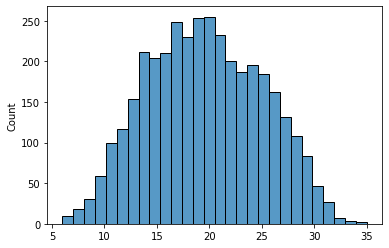

In [ ]:
tmp1 = [len(x) for x in train_df['s1_proc']]
tmp2 = [len(x) for x in train_df['s2_proc']]
tmp3 = [len(x) for x in dev_df['s1_proc']]
tmp4 = [len(x) for x in dev_df['s1_proc']]

%matplotlib inline
sns.histplot(tmp1)
plt.show()

So, static doc size will be "32"

LSTM, or generally NN, needs static input shape, unfortunately.

## indexing words then Padding

In [ ]:
# fitting keras tokenizer on train data 
from keras.preprocessing.text import Tokenizer
tokenizer =  Tokenizer()
texts = []
texts += train_tmp['s1_proc'].tolist()
texts += train_tmp['s2_proc'].tolist()
tokenizer.fit_on_texts(texts)

In [ ]:
len(tokenizer.word_index)

9900

In [ ]:
import tensorflow as tf
import keras
from keras.preprocessing.sequence import pad_sequences 


# 0. indexing words (with Keras tokenizer)
# 1. unk_removal for dev and holdout sets
# 2. padding  
# note: we dont need step 1. Keras tokenizer ignores unk words
t_indexed = []
t_indexed.append(tokenizer.texts_to_sequences(train_tmp['s1_proc'])) 
t_indexed.append(tokenizer.texts_to_sequences(train_tmp['s2_proc'])) 

d_indexed = []
d_indexed.append(tokenizer.texts_to_sequences(dev_tmp['s1_proc'])) 
d_indexed.append(tokenizer.texts_to_sequences(dev_tmp['s2_proc']))

h_indexed = []
h_indexed.append(tokenizer.texts_to_sequences(holdout_tmp['s1_proc'])) 
h_indexed.append(tokenizer.texts_to_sequences(holdout_tmp['s2_proc'])) 

from keras.preprocessing.sequence import pad_sequences 
pad_maxlen = 32
t_indexed[0] = pad_sequences(t_indexed[0],maxlen=pad_maxlen)
t_indexed[1] = pad_sequences(t_indexed[1],maxlen=pad_maxlen)
d_indexed[0] = pad_sequences(d_indexed[0],maxlen=pad_maxlen)
d_indexed[1] = pad_sequences(d_indexed[1],maxlen=pad_maxlen)
h_indexed[0] = pad_sequences(h_indexed[0],maxlen=pad_maxlen)
h_indexed[1] = pad_sequences(h_indexed[1],maxlen=pad_maxlen)

def str_convert(twoDlist):
  d = twoDlist.tolist()
  i = -1
  for lst in d:
    i +=1
    j = -1
    for char in lst:
      j+=1
      lst[j] = str(char)
  return d

train_df['s1_pad_int'] = t_indexed[0].tolist()
train_df['s2_pad_int'] = t_indexed[1].tolist()
dev_df['s1_pad_int'] = d_indexed[0].tolist()
dev_df['s2_pad_int'] = d_indexed[1].tolist()
holdout_df['s1_pad_int'] = h_indexed[0].tolist()
holdout_df['s2_pad_int'] = h_indexed[1].tolist()

t_indexed[0] = str_convert(t_indexed[0])
t_indexed[1] = str_convert(t_indexed[1])
d_indexed[0] = str_convert(d_indexed[0])
d_indexed[1] = str_convert(d_indexed[1])
h_indexed[0] = str_convert(h_indexed[0])
h_indexed[1] = str_convert(h_indexed[1])

In [ ]:
train_df.head(1)

,Unnamed: 0,label,id1,id2,sentence1,sentence2,s1_proc,s2_proc,s1_pad_int,s2_pad_int,s1_pad,s2_pad,s1_w2v,s2_w2v,s1_fast,s2_fast
0,0,1,702876,702977,"Amrozi accused his brother, whom he called ""th...","Referring to him as only ""the witness"", Amrozi...","[Amrozi, accuse, his, brother, whom, he, call,...","[Referring, to, him, as, only, the, witness, A...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0.009873696, -0.29772758, 0.020134062, -0.34...","[[0.009873696, -0.29772758, 0.020134062, -0.34...","[[0.17214881, 0.05662593, 0.08894413, 0.043740...","[[0.17214881, 0.05662593, 0.08894413, 0.043740..."


In [ ]:
train_df['s1_pad'] = t_indexed[0]
train_df['s2_pad'] = t_indexed[1]
dev_df['s1_pad'] = d_indexed[0]
dev_df['s2_pad'] = d_indexed[1]
holdout_df['s1_pad'] = h_indexed[0]
holdout_df['s2_pad'] = h_indexed[1]

In [ ]:
type(train_df['s1_pad'].iloc[0][0])

str

In [ ]:
train_df.head(1)

,Unnamed: 0,label,id1,id2,sentence1,sentence2,s1_proc,s2_proc,s1_pad_int,s2_pad_int,s1_pad,s2_pad
0,0,1,702876,702977,"Amrozi accused his brother, whom he called ""th...","Referring to him as only ""the witness"", Amrozi...","[Amrozi, accuse, his, brother, whom, he, call,...","[Referring, to, him, as, only, the, witness, A...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [ ]:
holdout_df.head(1)

,Unnamed: 0,label,id1,id2,sentence1,sentence2,s1_proc,s2_proc,s1_pad_int,s2_pad_int,s1_pad,s2_pad
0,0,1,1089874,1089925,"PCCW's chief operating officer, Mike Butcher, ...",Current Chief Operating Officer Mike Butcher a...,"[PCCW, s, chief, operate, officer, Mike, Butch...","[Current, Chief, Operating, Officer, Mike, But...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [ ]:
#  tokenizer.texts_to_sequences(dev_tmp['s1_proc'])[293]

In [ ]:
# tokenizer.sequences_to_texts([[156, 134, 1903]])

## Dump df

In [ ]:
train_df.to_pickle("train_df.pkl") 
dev_df.to_pickle("dev_df.pkl") 

## Q1

### Fit embeddings 

In [ ]:
cores = cpu_count()

In [ ]:
cols = [train_df['s1_pad'].squeeze() ,train_df['s2_pad'].squeeze() ]
all_sentences = pd.concat(cols, ignore_index=True)

In [ ]:
all_sentences

0       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
1       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
2       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 34,...
3       [0, 0, 0, 0, 0, 0, 0, 279, 2, 1648, 2446, 47, ...
4       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 79, 80, 1...
                              ...                        
7333    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 419, 75, 7, ...
7334    [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 9899, 145, 3948...
7335    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
7336    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 242...
7337    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 24, 457, ...
Length: 7338, dtype: object

In [ ]:
w2v_model = Word2Vec(
    size = 100,
    window = 5,
    min_count = 0,
    workers = cores,
    sg = 1
)

w2v_model.build_vocab(all_sentences)

w2v_model.train(
    sentences = all_sentences,
    total_examples = w2v_model.corpus_count,
    epochs = 200 )

(23828901, 46963200)

In [ ]:
fastcook = FastText(
    size = 100,
    window = 5,
    min_count = 0,
    workers = cores,
    sg = 1
)  # instantiate

fastcook.build_vocab(sentences=all_sentences) # fit

fastcook.train(sentences = all_sentences,
               total_examples = fastcook.corpus_count,
               epochs = 200)  # train

In [ ]:
%cd /content/drive/MyDrive/chatBot_momtazi/data/5

/content/drive/MyDrive/chatBot_momtazi/data


In [ ]:
# Dumping embedding models
fastcook.save("fastcook.model")
w2v_model.save("w2v_model.model")

In [ ]:
%%capture
# loading emmbedding models
!gdown --id 1-DOoBnPeHQoPmPcqYMZpOuTFfuCsFSmO
!gdown --id 1-DXHgEQI4-fLfgVqvDOErsCUfzF6VE-a

fastcook = FastText.load("fastcook.model")
w2v_model = Word2Vec.load("w2v_model.model")

### generate docs embeddings

In [ ]:
t_w2v = [train_df['s1_pad'].tolist(), train_df['s2_pad'].tolist()]
t_fast = [train_df['s1_pad'].tolist(), train_df['s2_pad'].tolist()]
d_w2v = [dev_df['s1_pad'].tolist(), dev_df['s2_pad'].tolist()]
d_fast = [dev_df['s1_pad'].tolist(), dev_df['s2_pad'].tolist()]
h_w2v = [holdout_df['s1_pad'].tolist(), holdout_df['s2_pad'].tolist()]
h_fast = [holdout_df['s1_pad'].tolist(), holdout_df['s2_pad'].tolist()]

In [ ]:
def generate_embeddings(docs,model):
  for col_id in range(len(docs)):
    for row_id in range(len(docs[col_id])):
      docs[col_id][row_id] = [model[key] for key in docs[col_id][row_id]]
      



In [ ]:
generate_embeddings(t_w2v,w2v_model.wv)
generate_embeddings(t_fast,fastcook.wv)
generate_embeddings(d_w2v,w2v_model.wv)
generate_embeddings(d_fast,fastcook.wv)
generate_embeddings(h_w2v,w2v_model.wv)
generate_embeddings(h_fast,fastcook.wv)

In [ ]:
train_df['s1_w2v'] = t_w2v[0]
train_df['s2_w2v'] = t_w2v[1]
train_df['s1_fast'] = t_fast[0]
train_df['s2_fast'] = t_fast[1]

dev_df['s1_w2v'] = d_w2v[0]
dev_df['s2_w2v'] = d_w2v[1]
dev_df['s1_fast'] = d_fast[0]
dev_df['s2_fast'] = d_fast[1]

holdout_df['s1_w2v'] = h_w2v[0]
holdout_df['s2_w2v'] = h_w2v[1]
holdout_df['s1_fast'] = h_fast[0]
holdout_df['s2_fast'] = h_fast[1]

In [ ]:
train_df.head(1)

,Unnamed: 0,label,id1,id2,sentence1,sentence2,s1_proc,s2_proc,s1_pad_int,s2_pad_int,s1_pad,s2_pad,s1_w2v,s2_w2v,s1_fast,s2_fast
0,0,1,702876,702977,"Amrozi accused his brother, whom he called ""th...","Referring to him as only ""the witness"", Amrozi...","[Amrozi, accuse, his, brother, whom, he, call,...","[Referring, to, him, as, only, the, witness, A...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0.009873696, -0.29772758, 0.020134062, -0.34...","[[0.009873696, -0.29772758, 0.020134062, -0.34...","[[0.17214881, 0.05662593, 0.08894413, 0.043740...","[[0.17214881, 0.05662593, 0.08894413, 0.043740..."


### Dumping data frames

In [ ]:

train_df.to_pickle("train_df.pkl") 
dev_df.to_pickle("dev_df.pkl") 
holdout_df.to_pickle("holdout_df.pkl") 

## Q2

### Loading dataframes

In [23]:
%%capture
# %cd /content/drive/MyDrive/chatBot_momtazi/data/5
# !pip install --upgrade --no-cache-dir gdown
import pandas as pd
!gdown --id 1avl30eUekg_ZKPCMEniV63FGlErWMcGv # dev data frame
!gdown --id 1I3mJ6iq7pUq4gKccKVBYC5keTgzhbVBp # TRAIN 
!gdown --id 1-6JelKcyWg7KxV0s3RyWmtRbcbTAzMW9 # holdout data frame

train_df = pd.read_pickle("train_df.pkl")
dev_df= pd.read_pickle("dev_df.pkl") 
holdout_df= pd.read_pickle("holdout_df.pkl") 

In [24]:
holdout_df.head(1)

,Unnamed: 0,label,id1,id2,sentence1,sentence2,s1_proc,s2_proc,s1_pad_int,s2_pad_int,s1_pad,s2_pad,s1_w2v,s2_w2v,s1_fast,s2_fast
0,0,1,1089874,1089925,"PCCW's chief operating officer, Mike Butcher, ...",Current Chief Operating Officer Mike Butcher a...,"[PCCW, s, chief, operate, officer, Mike, Butch...","[Current, Chief, Operating, Officer, Mike, But...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0.009873696, -0.29772758, 0.020134062, -0.34...","[[0.009873696, -0.29772758, 0.020134062, -0.34...","[[0.17214881, 0.05662593, 0.08894413, 0.043740...","[[0.17214881, 0.05662593, 0.08894413, 0.043740..."


### Preparing test/Dev/holdout X and Y sets

In [31]:
# vocab_size = len(tokenizer.word_index) + 1
# vocab_size
# > 9901 
vocab_size = 9901

train_s1_seq = np.array(train_df['s1_w2v'].tolist())
train_s2_seq = np.array(train_df['s2_w2v'].tolist())
x_train = [train_s1_seq,train_s2_seq]
y_train = np.array(train_df['label'].tolist())

dev_s1_seq = np.array(dev_df['s1_w2v'].tolist())
dev_s2_seq = np.array(dev_df['s2_w2v'].tolist())
x_dev = [dev_s1_seq,dev_s2_seq]
y_dev = np.array(dev_df['label'].tolist())

h_s1_seq = np.array(holdout_df['s1_w2v'].tolist())
h_s2_seq = np.array(holdout_df['s2_w2v'].tolist())
x_holdout = [h_s1_seq,h_s2_seq]
y_holdout = np.array(holdout_df['label'].tolist())




### Bidirectional LSTM Siamese model 

In [32]:
plot_losses = PlotLosses()

# define checkpoints
checkpoint = ModelCheckpoint('/content/drive/MyDrive/chatBot_momtazi/data/5/biLSTM-{epoch:03d}--{val_accuracy:03f}.h5',
                             verbose=1, monitor='val_loss',save_best_only=True,
                             save_weights_only=True, mode='min')

In [36]:
q2_in_1 = Input(shape=(32,100,))
q2_in_2 = Input(shape=(32,100,))


q2_lstm = Bidirectional(LSTM(300,
                            dropout=0.5,
                            activation="relu",
                            return_sequences=True))
vector_1 = q2_lstm(q2_in_1)
vector_2 = q2_lstm(q2_in_2)

my_attention = attention(return_sequences=False)

vector_1 = my_attention(vector_1)
vector_2 = my_attention(vector_2)

q2_conc = Concatenate(axis=-1)([vector_1,vector_2])

q2_dlayer = Dense(100, activation="relu", name='dlayer')(q2_conc)

q2_dlayer2 = Dense(100, activation="relu", name='dlayer2')(q2_dlayer)

q2_dlayer3 = Dense(100, activation="relu", name='dlayer3')(q2_dlayer2)

q2_out = Dense(1, activation="sigmoid", name = 'out')(q2_dlayer3)

q2_model = Model([q2_in_1, q2_in_2], q2_out)

opt = SGD(learning_rate=0.1, momentum=0.9)

q2_model.compile(loss="binary_crossentropy",
              metrics=['accuracy'],
              optimizer=opt,)

q2_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 32, 100)]    0           []                               
                                                                                                  
 input_4 (InputLayer)           [(None, 32, 100)]    0           []                               
                                                                                                  
 bidirectional_1 (Bidirectional  (None, 32, 600)     962400      ['input_3[0][0]',                
 )                                                                'input_4[0][0]']                
                                                                                                  
 attention (attention)          (None, 600)          632         ['bidirectional_1[0][0]',  

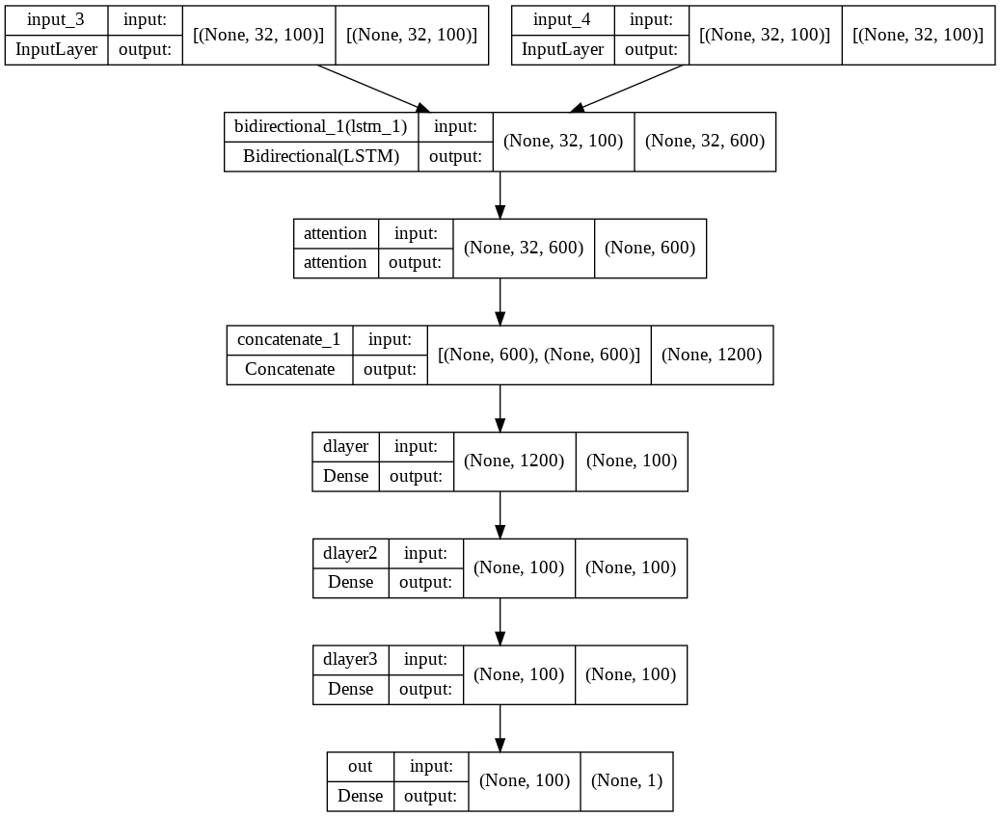

In [37]:
plot_model(q2_model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

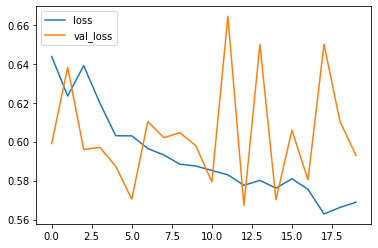

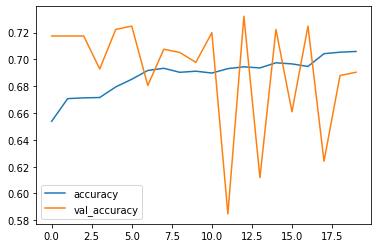

58/58 [==============================] - 46s 788ms/step - loss: 0.5689 - accuracy: 0.7059 - val_loss: 0.5929 - val_accuracy: 0.6904


In [38]:
q2_model.fit(x_train,y_train,
             epochs = 20,
             batch_size=64,
             validation_data=(x_dev,y_dev),
             callbacks= [checkpoint, plot_losses])

### Results plot

In [74]:
bilstm_yhat = q2_model.predict(x_holdout)
bilstm_yhat = np.rint(bilstm_yhat)

In [82]:
from sklearn.metrics import classification_report
print(classification_report(y_holdout, bilstm_yhat))
from sklearn.metrics import precision_score
# Average is assigned micro
precisionScore_sklearn_microavg = precision_score(y_holdout, bilstm_yhat, average='micro')
# Average is assigned macro
precisionScore_sklearn_macroavg = precision_score(y_holdout, bilstm_yhat, average='macro')
# Printing micro and macro average precision score
precisionScore_sklearn_microavg, precisionScore_sklearn_macroavg

              precision    recall  f1-score   support

           0       0.59      0.31      0.40       578
           1       0.72      0.89      0.80      1147

    accuracy                           0.70      1725
   macro avg       0.65      0.60      0.60      1725
weighted avg       0.67      0.70      0.66      1725



(0.6950724637681159, 0.6521468495343761)

## Q3

### LSTM

In [47]:
plot_losses = PlotLosses()

# define checkpoints
lstm_chk = ModelCheckpoint('/content/drive/MyDrive/chatBot_momtazi/data/5/LSTM-{epoch:03d}--{val_accuracy:03f}.h5',
                             verbose=1, monitor='val_loss',save_best_only=True,
                             save_weights_only=True, mode='min')

In [44]:
q3lstm_in_1 = Input(shape=(32,100,))
q3lstm_in_2 = Input(shape=(32,100,))


q3lstm_lstm = LSTM(300,
                  dropout=0.5,
                  activation="relu",
                  return_sequences=True)

vector_1 = q3lstm_lstm(q2_in_1)
vector_2 = q3lstm_lstm(q2_in_2)

my_attention = attention(return_sequences=False)

vector_1 = my_attention(vector_1)
vector_2 = my_attention(vector_2)

q3lstm_conc = Concatenate(axis=-1)([vector_1,vector_2])

q3lstm_dlayer = Dense(100, activation="relu", name='dlayer')(q3lstm_conc)

q3lstm_dlayer2 = Dense(100, activation="relu", name='dlayer2')(q3lstm_dlayer)

q3lstm_dlayer3 = Dense(100, activation="relu", name='dlayer3')(q3lstm_dlayer2)

q3lstm_out = Dense(1, activation="sigmoid", name = 'out')(q3lstm_dlayer3)

q3lstm_model = Model([q2_in_1, q2_in_2], q3lstm_out)

opt = SGD(learning_rate=0.1, momentum=0.9)

q3lstm_model.compile(loss="binary_crossentropy",
              metrics=['accuracy'],
              optimizer=opt,)

q3lstm_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 32, 100)]    0           []                               
                                                                                                  
 input_4 (InputLayer)           [(None, 32, 100)]    0           []                               
                                                                                                  
 lstm_2 (LSTM)                  (None, 32, 300)      481200      ['input_3[0][0]',                
                                                                  'input_4[0][0]']                
                                                                                                  
 attention_1 (attention)        (None, 300)          332         ['lstm_2[0][0]',           

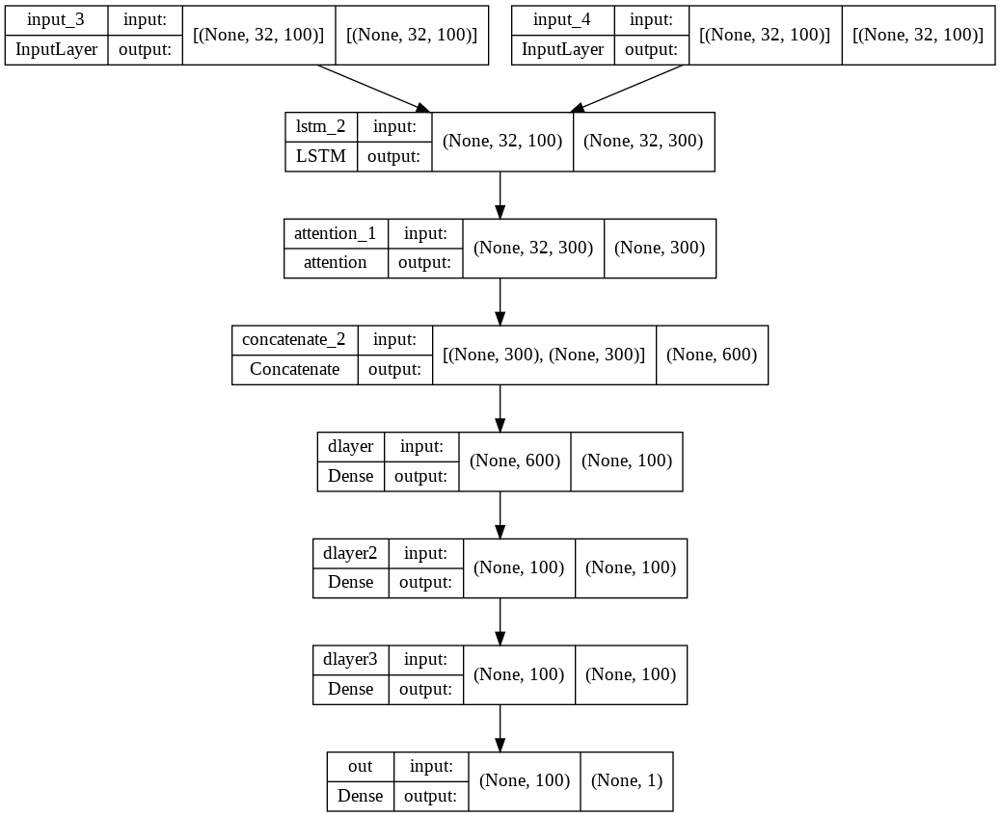

In [45]:
plot_model(q3lstm_model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

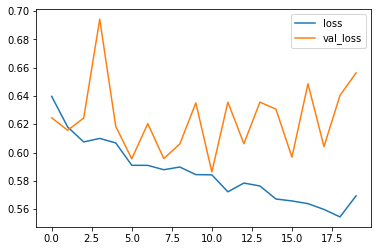

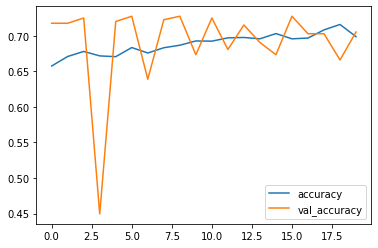

58/58 [==============================] - 24s 415ms/step - loss: 0.5694 - accuracy: 0.6986 - val_loss: 0.6563 - val_accuracy: 0.7052


In [50]:
q3lstm_model.fit(x_train,y_train,
             epochs = 20,
             batch_size=64,
             validation_data=(x_dev,y_dev),
             callbacks= [lstm_chk, plot_losses])

### LSTM result

In [72]:
lstm_yhat = q3lstm_model.predict(x_holdout)
lstm_yhat = np.rint(lstm_yhat)

In [81]:
from sklearn.metrics import classification_report
labels=[0, 1, 3]
print(classification_report(y_holdout, lstm_yhat,))
from sklearn.metrics import precision_score
# Average is assigned micro
precisionScore_sklearn_microavg = precision_score(y_holdout, lstm_yhat, average='micro')
# Average is assigned macro
precisionScore_sklearn_macroavg = precision_score(y_holdout, lstm_yhat, average='macro')
# Printing micro and macro average precision score
precisionScore_sklearn_microavg, precisionScore_sklearn_macroavg

              precision    recall  f1-score   support

           0       0.60      0.20      0.30       578
           1       0.70      0.93      0.80      1147

    accuracy                           0.69      1725
   macro avg       0.65      0.57      0.55      1725
weighted avg       0.67      0.69      0.63      1725



(0.687536231884058, 0.6505456349206349)

### GRU

In [52]:
plot_losses = PlotLosses()

# define checkpoints
gru_chk = ModelCheckpoint('/content/drive/MyDrive/chatBot_momtazi/data/5/GRU-{epoch:03d}--{val_accuracy:03f}.h5',
                             verbose=1, monitor='val_loss',save_best_only=True,
                             save_weights_only=True, mode='min')

In [48]:
q3gru_in_1 = Input(shape=(32,100,))
q3gru_in_2 = Input(shape=(32,100,))


q3gru_lstm = GRU(300,
                  dropout=0.5,
                  activation="relu",
                  return_sequences=True)

vector_1 = q3gru_lstm(q2_in_1)
vector_2 = q3gru_lstm(q2_in_2)

my_attention = attention(return_sequences=False)

vector_1 = my_attention(vector_1)
vector_2 = my_attention(vector_2)

q3gru_conc = Concatenate(axis=-1)([vector_1,vector_2])

q3gru_dlayer = Dense(100, activation="relu", name='dlayer')(q3gru_conc)

q3gru_dlayer2 = Dense(100, activation="relu", name='dlayer2')(q3gru_dlayer)

q3gru_dlayer3 = Dense(100, activation="relu", name='dlayer3')(q3gru_dlayer2)

q3gru_out = Dense(1, activation="sigmoid", name = 'out')(q3gru_dlayer3)

q3gru_model = Model([q2_in_1, q2_in_2], q3gru_out)

opt = SGD(learning_rate=0.1, momentum=0.9)

q3gru_model.compile(loss="binary_crossentropy",
              metrics=['accuracy'],
              optimizer=opt,)

q3gru_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 32, 100)]    0           []                               
                                                                                                  
 input_4 (InputLayer)           [(None, 32, 100)]    0           []                               
                                                                                                  
 gru (GRU)                      (None, 32, 300)      361800      ['input_3[0][0]',                
                                                                  'input_4[0][0]']                
                                                                                                  
 attention_2 (attention)        (None, 300)          332         ['gru[0][0]',              

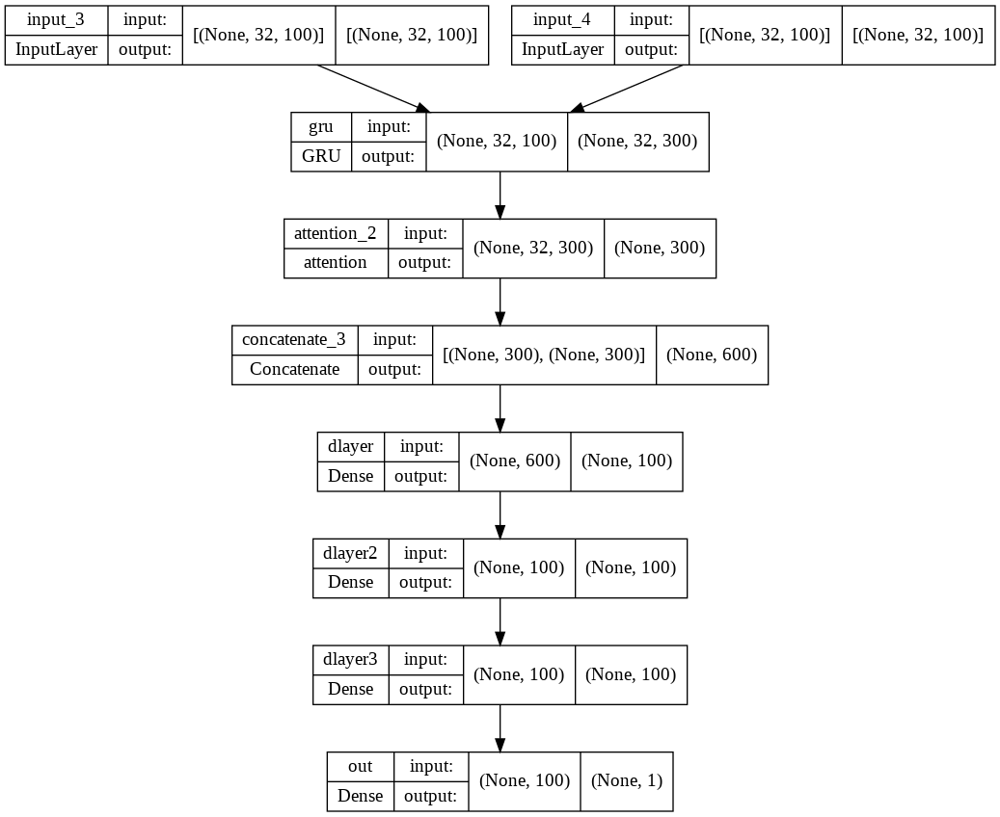

In [49]:
plot_model(q3gru_model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

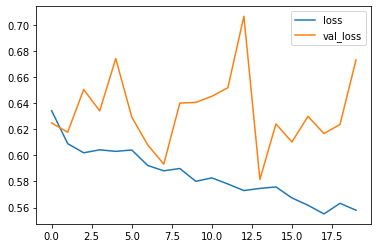

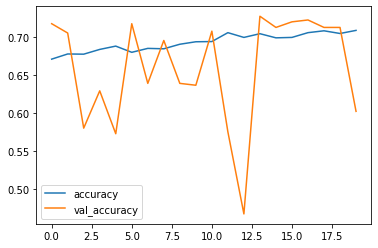

58/58 [==============================] - 19s 326ms/step - loss: 0.5579 - accuracy: 0.7086 - val_loss: 0.6732 - val_accuracy: 0.6020


In [53]:
q3gru_model.fit(x_train,y_train,
             epochs = 20,
             batch_size=64,
             validation_data=(x_dev,y_dev),
             callbacks= [gru_chk, plot_losses])

### GRE results

In [80]:
gru_yhat = q3gru_model.predict(x_holdout)
gru_yhat = np.rint(gru_yhat)
from sklearn.metrics import classification_report
print(classification_report(y_holdout, gru_yhat))
from sklearn.metrics import precision_score
# Average is assigned micro
precisionScore_sklearn_microavg = precision_score(y_holdout, gru_yhat, average='micro')
# Average is assigned macro
precisionScore_sklearn_macroavg = precision_score(y_holdout, gru_yhat, average='macro')
# Printing micro and macro average precision score
precisionScore_sklearn_microavg, precisionScore_sklearn_macroavg

              precision    recall  f1-score   support

           0       0.46      0.52      0.49       578
           1       0.74      0.69      0.72      1147

    accuracy                           0.63      1725
   macro avg       0.60      0.60      0.60      1725
weighted avg       0.65      0.63      0.64      1725



(0.6336231884057971, 0.5992851588631153)

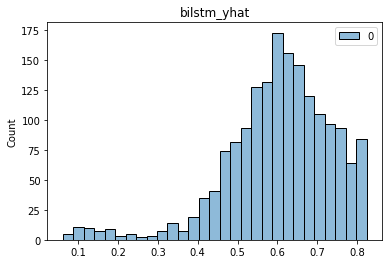

In [65]:
# %matplotlib inline
# sns.histplot(bilstm_yhat).set_title("bilstm_yhat")
# plt.show()

In [79]:
np.mean(y_holdout)

0.664927536231884

## Q4

Note: threshold is considered 0.5

Note: This data set is imbalanced and we can do further preprocessing to redress the balance of it.

Comparsion:

+ bidirecitonal LSTM has outperformed others in terms of holdout set accuracy, as I expected. Just after that, LSTM has reaches 69%. Lastly, GRU has eached only 63% accuracy, which is extremely disappointing since if we predict all holdout set as 1 we can have 66% performance,can't we?

+ The superiority of Bidirectional LSTM lies partly in its more parameters. It has nearly half a milion more parameters than others.

+ What I speculate about the very close performance of LSTM to Bi-LSTM is in paraphrase detection LSTM backward movement (aka backprop) does not increase our knowledge about that sentence. we can capture one sentence's meaning in one direction and use it after concatenation layer for comparsion.

+ I simply don't know why the performance of GRU has dropped on holdout set. Looking forward to hear from a GRU expert ( Perhaps you! ).

+ Now it comes to comparing models with respect to other metrics than accuracy.
  + note 1: sklearn library can give you more metrics than  what I have already printed ( visit: https://vitalflux.com/micro-average-macro-average-scoring-metrics-multi-class-classification-python/#:~:text=The%20macro%2Daverage%20precision%20and,individual%20classes%27%20F1%2Dscore.) 
  + note 2: "Accuracy: is not enough for comparing models, especially in case of imbalanced datasets, like Ham/Spam classification.
  + note 3: The difference between recall and percision is Precision look at how much we are accurate when we predict a sample as positive(aka 1) and recall is how much our model is accurate at predicting ACTUALLY possitive samples. In our case Precision is more important than recall(why?). Hence, Bidirectinoal LSTM and LSTM model are better than GRU in this task on acount of having higher Percision. (Ref: https://towardsdatascience.com/should-i-look-at-precision-recall-or-specificity-sensitivity-3946158aace1) (Ref: https://datascience.stackexchange.com/questions/30881/when-is-precision-more-important-over-recall)
  + note 4: F1 measure is simply a way of considering both recall and percision with one number, why? for simpler comparsion between models.
  + note 5: Macro and Micro? -> Macro arithmatic mean of a metric among all classes in our dataset. In Micro-average method, you sum up the individual true positives, false positives, and false negatives of the system for different sets and the apply them to get the statistic.(Ref: https://datascience.stackexchange.com/questions/15989/micro-average-vs-macro-average-performance-in-a-multiclass-classification-settin )

## Q5

In [39]:
attention_layer =  q2_model.layers[3]
attention_w = attention_layer.get_weights()

In [40]:
attention_layer.name

'attention'

In [41]:
%%capture
!pip install seaborn

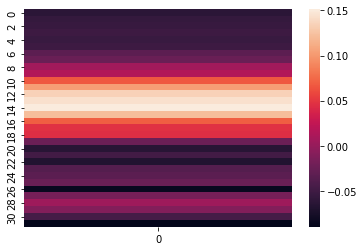

In [42]:
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

uniform_data = np.random.rand(10, 12)
ax = sns.heatmap(attention_w[1])
plt.show()

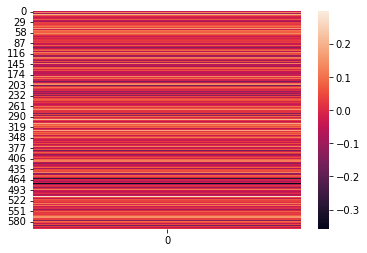

In [43]:
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

uniform_data = np.random.rand(10, 12)
ax = sns.heatmap(attention_w[0])
plt.show()

**Attention layer interpretation:**

At first, inputs of the attention layer are in 32*600 shape, which means there are 32 words each represented by a 600-entry vector.

Seconly, We need to know the the difference between attention layer vs self attention layer vs multi-headed attention layer. I assume you already know.

Thirdly, weighted of next layers and thier impact on our finall fuzzy ( between 0 and 1) output needs to be included in our interpretations of attention layer's wieghts. Since the question has not mentioned considering this, I'll skip this.

Finally, these very interesting results demonstrate how much relative importance the models is giving to each "" word "" and eahc "" embedding feature "".The brighther the index is, the more important it is, the more attention is paid to it, the more contribution the final output. Hence, words between indices 10 and 20 are more important in our task, and starting words are not that much important, why? Most likely due to our "pre padding". Regarding attentions to the Bidirectional LSTM output (Bi-LSTM emmbeding) we don't see any particular pattern which means are dimentions have a role in our final result. If we had used attention layer just after our Skip-gram embedding layer and many dimentions where dark in our heatmap, I guess we could say that we are using more than enough dimention for our word2vec model and most likely they are reduntant and we can reduce embedding output dimention without lossing the generality of out model.

# Different parameter-tuning experiments / References / Future works

## Attention 

In [ ]:
# Ref: https://analyticsindiamag.com/hands-on-guide-to-bi-lstm-with-attention/

In [ ]:
import numpy as np

from keras.models import Sequential
from keras.layers import Dense, Dropout, Embedding, LSTM, Bidirectional


In [ ]:
from keras.datasets import imdb 
from keras.preprocessing import sequence
from keras.models import Sequential

In [ ]:
n_unique_words = 10000
(x_train, y_train),(x_test, y_test) = imdb.load_data(num_words=n_unique_words)

17473536/17464789 [==============================] - 0s 0us/step


In [ ]:
maxlen = 200
x_train = sequence.pad_sequences(x_train, maxlen=maxlen)
x_test = sequence.pad_sequences(x_test, maxlen=maxlen)
y_train = np.array(y_train)
y_test = np.array(y_test) 

In [ ]:
 model = Sequential()
 model.add(Embedding(n_unique_words, 128, input_length=maxlen))
 model.add(Bidirectional(LSTM(64)))
 model.add(Dropout(0.5))
 model.add(Dense(1, activation='sigmoid'))
 model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy']) 
 model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 200, 128)          1280000   
                                                                 
 bidirectional_2 (Bidirectio  (None, 128)              98816     
 nal)                                                            
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 1,378,945
Trainable params: 1,378,945
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.fit(x_train, y_train, epochs = 12,
          batch_size=64,validation_data=(x_test, y_test))

Epoch 1/12
391/391 [==============================] - 203s 464ms/step - loss: 0.4091 - accuracy: 0.8104 - val_loss: 0.3338 - val_accuracy: 0.8680
Epoch 2/12
391/391 [==============================] - 191s 488ms/step - loss: 0.2394 - accuracy: 0.9082 - val_loss: 0.3319 - val_accuracy: 0.8646
Epoch 3/12
391/391 [==============================] - 197s 504ms/step - loss: 0.1828 - accuracy: 0.9323 - val_loss: 0.3487 - val_accuracy: 0.8685
Epoch 4/12
391/391 [==============================] - 180s 460ms/step - loss: 0.1429 - accuracy: 0.9483 - val_loss: 0.3587 - val_accuracy: 0.8595
Epoch 5/12
391/391 [==============================] - 189s 484ms/step - loss: 0.1148 - accuracy: 0.9606 - val_loss: 0.4825 - val_accuracy: 0.8586
Epoch 6/12
391/391 [==============================] - 179s 459ms/step - loss: 0.0988 - accuracy: 0.9653 - val_loss: 0.4934 - val_accuracy: 0.8606
Epoch 7/12
391/391 [==============================] - 179s 457ms/step - loss: 0.0830 - accuracy: 0.9720 - val_loss: 0.5036 -

KeyboardInterrupt: ignored

## Further Developments notes: 


SOTA result on this Dataset! https://paperswithcode.com/dataset/mrpc

Attention VS Self Attention: https://datascience.stackexchange.com/questions/49468/whats-the-difference-between-attention-vs-self-attention-what-problems-does-ea



References:

https://stackoverflow.com/questions/43715047/how-do-i-get-the-weights-of-a-layer-in-keras

https://medium.com/ai-salon/understanding-deep-self-attention-mechanism-in-convolution-neural-networks-e8f9c01cb251

https://analyticsindiamag.com/hands-on-guide-to-bi-lstm-with-attention/


https://medium.com/@prabhnoor0212/siamese-network-keras-31a3a8f37d04

https://github.com/prabhnoor0212/Siamese-Network-Text-Similarity

## model 0


In [ ]:
!pip install tensorflow

In [ ]:
import tensorflow as tf
# import keras

from keras.regularizers import l2
# from keras.models import Sequential
# from keras.optimizers import Adam
from keras.layers import Conv2D, ZeroPadding2D, Activation, Input, concatenate
from keras.models import Model

# from keras.layers.normalization import BatchNormalization
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import Concatenate
from keras.layers.core import Lambda, Flatten, Dense
from keras.initializers import glorot_uniform
from keras.layers import Input, Dense, Flatten, GlobalMaxPool2D, GlobalAvgPool2D, Concatenate, Multiply, Dropout, Subtract, Add, Conv2D

In [ ]:
from keras.layers import Input, Concatenate, Conv2D, Flatten, Dense, Embedding, LSTM
from keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.layers import Bidirectional
import numpy as np

In [ ]:
train_s1_seq = np.array(train_df['s1_pad_int'].tolist())
train_s2_seq = np.array(train_df['s2_pad_int'].tolist())

(train_s2_seq.shape[1],)

(32,)

In [ ]:
input_1 = Input(shape=(train_s1_seq.shape[1],))
input_2 = Input(shape=(train_s2_seq.shape[1],))

vocab_size = len(tokenizer.word_index) + 1
# vocab_size
# > 9901 

val_s1_seq = np.array(dev_df['s1_pad_int'].tolist())
val_s2_seq = np.array(dev_df['s2_pad_int'].tolist())
val_label = np.array(dev_df['label'].tolist())
train_label = np.array(train_df['label'].tolist())
train_label.shape

9901

## M1

In [ ]:
embed_dim = 100
common_embed = Embedding(input_dim =vocab_size, 
                         output_dim=embed_dim, 
                         input_length=train_s1_seq.shape[1],
                         trainable=True)

lstm_1 = common_embed(input_1)
lstm_2 = common_embed(input_2)

common_lstm = Bidirectional(LSTM(64, activation="relu"))

vector_1 = common_lstm(lstm_1)
vector_2 = common_lstm(lstm_2)

conc = Concatenate(axis=-1)([vector_1,vector_2])

dlayer = Dense(100, activation="relu", name='dlayer')(conc)

out = Dense(1, activation="sigmoid", name = 'out')(dlayer)

model = Model([input_1, input_2], out)

opt = SGD(learning_rate=0.1, momentum=0.9)

model.compile(loss="binary_crossentropy",
              metrics=['accuracy'],
              optimizer=opt,)

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32)]         0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 32)]         0           []                               
                                                                                                  
 embedding (Embedding)          (None, 32, 100)      990100      ['input_1[0][0]',                
                                                                  'input_2[0][0]']                
                                                                                                  
 lstm (LSTM)                    (None, 64)           42240       ['embedding[0][0]',          

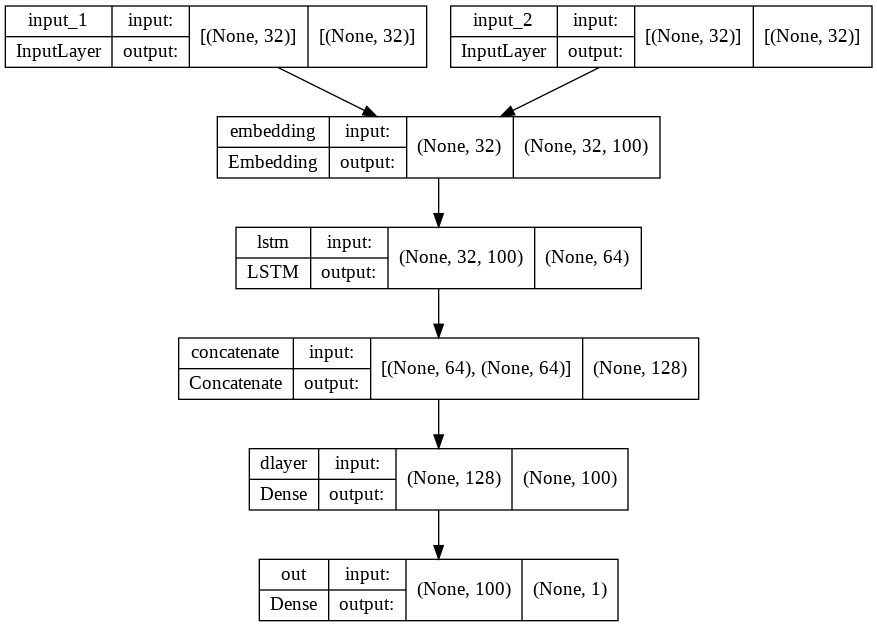

In [ ]:

from keras.utils.vis_utils import plot_model
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
model.fit([train_s1_seq,train_s2_seq],train_label, epochs = 100,
          batch_size=64,validation_data=([val_s1_seq, val_s2_seq],val_label))

## M2

In [ ]:
embed_dim = 100
common_embed = Embedding(input_dim =vocab_size, 
                         output_dim=embed_dim, 
                         input_length=train_s1_seq.shape[1],
                         trainable=True)

lstm_1 = common_embed(input_1)
lstm_2 = common_embed(input_2)

common_bi_lstm = Bidirectional(LSTM(64, activation="relu"))

vector_1 = common_bi_lstm(lstm_1)
vector_2 = common_bi_lstm(lstm_2)

conc = Concatenate(axis=-1)([vector_1,vector_2])

dlayer = Dense(100, activation="relu", name='dlayer')(conc)

out = Dense(1, activation="sigmoid", name = 'out')(dlayer)

model2 = Model([input_1, input_2], out)

opt = SGD(learning_rate=0.1, momentum=0.9)

model2.compile(loss="binary_crossentropy",
              metrics=['accuracy'],
              optimizer=opt,)

In [ ]:
model2.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32)]         0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 32)]         0           []                               
                                                                                                  
 embedding_1 (Embedding)        (None, 32, 100)      990100      ['input_1[0][0]',                
                                                                  'input_2[0][0]']                
                                                                                                  
 bidirectional (Bidirectional)  (None, 128)          84480       ['embedding_1[0][0]',      

In [ ]:
model2.fit([train_s1_seq,train_s2_seq],train_label, epochs = 100,
          batch_size=64,validation_data=([val_s1_seq, val_s2_seq],val_label))

Epoch 1/100
58/58 [==============================] - 14s 123ms/step - loss: 0.6413 - accuracy: 0.6708 - val_loss: 0.5952 - val_accuracy: 0.7174
Epoch 2/100
58/58 [==============================] - 6s 111ms/step - loss: 0.6342 - accuracy: 0.6708 - val_loss: 0.6007 - val_accuracy: 0.7174
Epoch 3/100
58/58 [==============================] - 6s 111ms/step - loss: 0.6343 - accuracy: 0.6708 - val_loss: 0.6022 - val_accuracy: 0.7174
Epoch 4/100
58/58 [==============================] - 6s 110ms/step - loss: 0.6326 - accuracy: 0.6708 - val_loss: 0.5954 - val_accuracy: 0.7174
Epoch 5/100
58/58 [==============================] - 6s 111ms/step - loss: 0.6260 - accuracy: 0.6708 - val_loss: 0.5803 - val_accuracy: 0.7174
Epoch 6/100
58/58 [==============================] - 6s 111ms/step - loss: 0.6152 - accuracy: 0.6795 - val_loss: 0.5880 - val_accuracy: 0.7076
Epoch 7/100
58/58 [==============================] - 6s 111ms/step - loss: 0.6128 - accuracy: 0.6792 - val_loss: 0.5789 - val_accuracy: 0.719

## M3

In [ ]:
embed_dim = 100
common_embed = Embedding(input_dim =vocab_size, 
                         output_dim=embed_dim, 
                         input_length=train_s1_seq.shape[1],
                         trainable=True)

lstm_1 = common_embed(input_1)
lstm_2 = common_embed(input_2)

common_bi_lstm = Bidirectional(LSTM(200, activation="relu"))

vector_1 = common_bi_lstm(lstm_1)
vector_2 = common_bi_lstm(lstm_2)

conc = Concatenate(axis=-1)([vector_1,vector_2])

dlayer = Dense(100, activation="relu", name='dlayer')(conc)

out = Dense(1, activation="sigmoid", name = 'out')(dlayer)

model3 = Model([input_1, input_2], out)

opt = SGD(learning_rate=0.1, momentum=0.9)

model3.compile(loss="binary_crossentropy",
              metrics=['accuracy'],
              optimizer=opt,)
model3.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32)]         0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 32)]         0           []                               
                                                                                                  
 embedding_2 (Embedding)        (None, 32, 100)      990100      ['input_1[0][0]',                
                                                                  'input_2[0][0]']                
                                                                                                  
 bidirectional_1 (Bidirectional  (None, 400)         481600      ['embedding_2[0][0]',      

In [ ]:
model3.fit([train_s1_seq,train_s2_seq],train_label, epochs = 1,
          batch_size=64,validation_data=([val_s1_seq, val_s2_seq],val_label))

58/58 [==============================] - 32s 548ms/step - loss: 0.0595 - accuracy: 0.9760 - val_loss: 2.6510 - val_accuracy: 0.6192


## M4

In [ ]:
from keras.layers import *
from keras.models import *
from keras import backend as K

class attention(Layer):
    
    def __init__(self, return_sequences=True):
        self.return_sequences = return_sequences
        super(attention,self).__init__()
        
    def build(self, input_shape):
        
        self.W=self.add_weight(name="att_weight", shape=(input_shape[-1],1),
                               initializer="normal")
        self.b=self.add_weight(name="att_bias", shape=(input_shape[1],1),
                               initializer="zeros")
        
        super(attention,self).build(input_shape)
        
    def call(self, x):
        
        e = K.tanh(K.dot(x,self.W)+self.b)
        a = K.softmax(e, axis=1)
        output = x*a
        
        if self.return_sequences:
            return output
        
        return K.sum(output, axis=1)

In [ ]:
embed_dim = 100
common_embed = Embedding(input_dim =vocab_size, 
                         output_dim=embed_dim, 
                         input_length=train_s1_seq.shape[1],
                         trainable=True)

lstm_1 = common_embed(input_1)
lstm_2 = common_embed(input_2)

common_bi_lstm = Bidirectional(LSTM(200,
                                    dropout=0.5,
                                    activation="relu",
                                    return_sequences=True))

vector_1 = common_bi_lstm(lstm_1)
vector_2 = common_bi_lstm(lstm_2)

my_attention = attention(return_sequences=False)

vector_1 = my_attention(vector_1)
vector_2 = my_attention(vector_2)

conc = Concatenate(axis=-1)([vector_1,vector_2])

dlayer = Dense(100, activation="relu", name='dlayer')(conc)

out = Dense(1, activation="sigmoid", name = 'out')(dlayer)

model4 = Model([input_1, input_2], out)

opt = SGD(learning_rate=0.001, momentum=0.5)

model4.compile(loss="binary_crossentropy",
              metrics=['accuracy'],
              optimizer=opt,)
model4.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32)]         0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 32)]         0           []                               
                                                                                                  
 embedding_7 (Embedding)        (None, 32, 100)      990100      ['input_1[0][0]',                
                                                                  'input_2[0][0]']                
                                                                                                  
 bidirectional_6 (Bidirectional  (None, 32, 400)     481600      ['embedding_7[0][0]',      

In [ ]:
model4.fit([train_s1_seq,train_s2_seq],train_label, epochs = 20,
          batch_size=64,validation_data=([val_s1_seq, val_s2_seq],val_label))

## M5

In [ ]:
s1_sg = np.array(train_df['s1_fast'].tolist())
s2_sg = np.array(train_df['s2_fast'].tolist())


val_s1_sg = np.array(dev_df['s1_fast'].tolist())
val_s2_sg = np.array(dev_df['s2_fast'].tolist())



val_label = np.array(dev_df['label'].tolist())
train_label = np.array(train_df['label'].tolist())


In [ ]:
s1_sg.shape

(3669, 32, 100)

In [ ]:
m5_in_1 = Input(shape=(32,100,))
m5_in_2 = Input(shape=(32,100,))


m5_lstm = Bidirectional(LSTM(300, activation="relu"))

vector_1 = m5_lstm(m5_in_1)
vector_2 = m5_lstm(m5_in_2)

m5_conc = Concatenate(axis=-1)([vector_1,vector_2])

m5_dlayer = Dense(100, activation="relu", name='dlayer')(m5_conc)

m5_out = Dense(1, activation="sigmoid", name = 'out')(m5_dlayer)

m5_model = Model([m5_in_1, m5_in_2], m5_out)

opt = SGD(learning_rate=0.1, momentum=0.9)

m5_model.compile(loss="binary_crossentropy",
              metrics=['accuracy'],
              optimizer=opt,)

m5_model.summary()

Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 32, 100)]    0           []                               
                                                                                                  
 input_10 (InputLayer)          [(None, 32, 100)]    0           []                               
                                                                                                  
 bidirectional_10 (Bidirectiona  (None, 600)         962400      ['input_9[0][0]',                
 l)                                                               'input_10[0][0]']               
                                                                                                  
 concatenate_10 (Concatenate)   (None, 1200)         0           ['bidirectional_10[0][0]',

In [ ]:
# fast 
m5_model.fit([s1_sg,s2_sg],train_label, epochs = 20,
          batch_size=64,validation_data=([val_s1_sg, val_s2_sg],val_label))

In [ ]:
m5_model.fit([s1_sg,s2_sg],train_label, epochs = 20,
          batch_size=64,validation_data=([val_s1_sg, val_s2_sg],val_label))